#IMPORTAR LIBRERIAS

In [10]:
from google.colab import drive
import pandas as pd
import numpy as np
import unicodedata
import random

#CARGAR DATOS DE RENDIMIENTO

In [11]:

Ruta1 = '/content/drive/MyDrive/Bases de datos_ML/Evaluaciones_Agropecuarias_Municipales_EVA_20250602.csv'
Ruta2 = '/content/drive/MyDrive/Bases de datos_ML/Evaluaciones_Agropecuarias_Municipales___EVA._2019_-_2023._Base_Agr_cola_20250602.csv'


df_rendimiento = pd.read_csv(Ruta1)
df_rendimiento = df_rendimiento.drop(columns=['ESTADO FISICO PRODUCCION',	'NOMBRE \nCIENTIFICO',	'CICLO DE CULTIVO'])

df_rendimiento2 = pd.read_csv(Ruta2)
df_rendimiento2 = df_rendimiento2.drop(columns=['Ciclo del cultivo',	'Estado físico del cultivo',	'Código del cultivo',	'Nombre científico del cultivo'])

df_rendimiento.columns = df_rendimiento2.columns

#UNIR AMBOS DATAFRAMES
nuevo_df = pd.concat([df_rendimiento, df_rendimiento2])

#ORDENAR POR AÑO
nuevo_df = nuevo_df.sort_values(by='Año')

nuevo_df[nuevo_df['Rendimiento'].isnull()]

nuevo_df.info()



<class 'pandas.core.frame.DataFrame'>
Index: 321640 entries, 157815 to 115571
Data columns (total 14 columns):
 #   Column                    Non-Null Count   Dtype  
---  ------                    --------------   -----  
 0   Código Dane departamento  321640 non-null  int64  
 1   Departamento              321640 non-null  object 
 2   Código Dane municipio     321640 non-null  int64  
 3   Municipio                 321639 non-null  object 
 4   Grupo cultivo             321640 non-null  object 
 5   Subgrupo                  321640 non-null  object 
 6   Cultivo                   321640 non-null  object 
 7   Desagregación cultivo     321640 non-null  object 
 8   Año                       321640 non-null  int64  
 9   Periodo                   321640 non-null  object 
 10  Área sembrada             321640 non-null  float64
 11  Área cosechada            321640 non-null  float64
 12  Producción                321640 non-null  float64
 13  Rendimiento               318207 non-null  f

#NORMALIZAR CONTENIDO DEL DF

In [12]:

def normalizar_texto(texto):
    if isinstance(texto, str):

        reemplazos = {
            'á': 'a', 'é': 'e', 'í': 'i', 'ó': 'o', 'ú': 'u',
            'Á': 'a', 'É': 'e', 'Í': 'i', 'Ó': 'o', 'Ú': 'u'
        }
        for original, reemplazo in reemplazos.items():
            texto = texto.replace(original, reemplazo)

        texto = texto.strip().lower()

        texto = ' '.join([palabra.capitalize() for palabra in texto.split()])
    return texto

for col in nuevo_df.columns:
    if nuevo_df[col].dtype == object:
        nuevo_df[col] = nuevo_df[col].apply(normalizar_texto)

nuevo_df[['Departamento','Municipio']].value_counts().reset_index()

,Departamento,Municipio,count
0,Huila,Garzon,947
1,Valle Del Cauca,Roldanillo,929
2,Huila,Gigante,926
3,Valle Del Cauca,Yumbo,914
4,Huila,Neiva,893
...,...,...,...
1145,Amazonas,La Pedrera,7
1146,Amazonas,La Chorrera,7
1147,Antioquia,Itagui,7
1148,Guainia,Cacahual,4


#FILTRAR UNICAMENTE EL DEPARTAMENTO Y SUS 5 MUNICIPIOS CON MAS DATOS

In [13]:
nuevo_df = nuevo_df[((nuevo_df['Municipio']=='Neiva')&(nuevo_df['Departamento']=='Huila'))|((nuevo_df['Municipio']=='La Plata')&(nuevo_df['Departamento']=='Huila'))|((nuevo_df['Municipio']=='Garzon')&(nuevo_df['Departamento']=='Huila'))|((nuevo_df['Municipio']=='Gigante')&(nuevo_df['Departamento']=='Huila'))|((nuevo_df['Municipio']=='Algeciras')&(nuevo_df['Departamento']=='Huila'))]

nuevo_df['Cultivo_final'] = nuevo_df.apply(
    lambda row: f"{row['Cultivo']} ({row['Desagregación cultivo']})"
                if pd.notnull(row['Desagregación cultivo']) and row['Desagregación cultivo'].lower() != row['Cultivo'].lower()
                else row['Cultivo'],
    axis=1
)

#nuevo_df.to_csv('df_rendimiento.csv', index=False)
nuevo_df.groupby(['Departamento', 'Municipio', 'Cultivo_final']).size().sort_values(ascending=False).reset_index()



/tmp/ipython-input-13-1638207986.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nuevo_df['Cultivo_final'] = nuevo_df.apply(


,Departamento,Municipio,Cultivo_final,0
0,Huila,Algeciras,Tomate,34
1,Huila,Algeciras,Pimenton,34
2,Huila,Neiva,Arroz (Arroz Riego),34
3,Huila,Neiva,Arveja,34
4,Huila,Neiva,Frijol,34
...,...,...,...,...
323,Huila,La Plata,Otros Citricos,2
324,Huila,Neiva,Otros Citricos,2
325,Huila,Gigante,Durazno O Albaricoque,1
326,Huila,Garzon,Tabaco Negro,1


#ELIMINAR COLUMNAS INNECESARIAS

In [14]:
nuevo_df.drop(columns=[
    'Grupo cultivo',
    'Desagregación cultivo',
    'Subgrupo',
    'Cultivo'
], inplace=True)



#ELIMINAR CULTIVOS CON 10 DATOS O MENOS

In [15]:

conteo = nuevo_df.groupby(['Municipio', 'Cultivo_final']).size().reset_index(name='conteo')


cultivos_validos = conteo[conteo['conteo'] > 10][['Municipio', 'Cultivo_final']]


nuevo_df = nuevo_df.merge(cultivos_validos, on=['Municipio', 'Cultivo_final'], how='inner')


nuevo_df.groupby(['Departamento', 'Municipio', 'Cultivo_final']).size().sort_values(ascending=False).reset_index()

#nuevo_df.to_csv('df_rendimiento.csv', index=False)

nuevo_df.info()


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 3813 entries, 0 to 3812
Data columns (total 11 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   Código Dane departamento  3813 non-null   int64  
 1   Departamento              3813 non-null   object 
 2   Código Dane municipio     3813 non-null   int64  
 3   Municipio                 3813 non-null   object 
 4   Año                       3813 non-null   int64  
 5   Periodo                   3813 non-null   object 
 6   Área sembrada             3813 non-null   float64
 7   Área cosechada            3813 non-null   float64
 8   Producción                3813 non-null   float64
 9   Rendimiento               3801 non-null   float64
 10  Cultivo_final             3813 non-null   object 
dtypes: float64(4), int64(3), object(4)
memory usage: 327.8+ KB


In [16]:
#Eliminar datos nulos por bajo porcentaje representativo
nuevo_df = nuevo_df.dropna()

nuevo_df[nuevo_df['Periodo']=='2007']

,Código Dane departamento,Departamento,Código Dane municipio,Municipio,Año,Periodo,Área sembrada,Área cosechada,Producción,Rendimiento,Cultivo_final
81,41,Huila,41396,La Plata,2007,2007,4.0,3.0,30.0,10.00,Curuba
82,41,Huila,41306,Gigante,2007,2007,4.0,4.0,26.0,6.50,Curuba
83,41,Huila,41020,Algeciras,2007,2007,9.0,7.0,60.0,8.50,Curuba
89,41,Huila,41020,Algeciras,2007,2007,4152.0,3848.0,4618.0,1.20,Cafe
90,41,Huila,41306,Gigante,2007,2007,4412.0,4091.0,5932.0,1.45,Cafe
...,...,...,...,...,...,...,...,...,...,...,...
266,41,Huila,41298,Garzon,2007,2007,65.0,60.0,570.0,9.50,Tomate De Arbol
267,41,Huila,41020,Algeciras,2007,2007,83.0,73.0,584.0,8.00,Tomate De Arbol
268,41,Huila,41396,La Plata,2007,2007,11.0,11.0,99.0,9.00,Tomate De Arbol
269,41,Huila,41306,Gigante,2007,2007,18.0,8.0,72.0,9.00,Tomate De Arbol


#AÑADIR PERIODOS ALEATORIOS

In [17]:
nuevo_df.drop(columns=['Año'], inplace=True)

nuevo_df.columns.values[4] = 'Año_periodo'


sin_periodo = nuevo_df['Año_periodo'].astype(str).str.fullmatch(r'\d{4}')


nuevo_df.loc[sin_periodo, 'Año_periodo'] = nuevo_df.loc[sin_periodo, 'Año_periodo'].apply(
    lambda x: str(x) + random.choice(['a', 'b'])
)


nuevo_df['Año_periodo'].unique()[:10]


array(['2006b', '2007a', '2007b', '2008a', '2008b', '2009a', '2009b',
       '2010b', '2010a', '2011b'], dtype=object)

#CARGAR DATOS CLIMATICOS POR MUNICIPIO

In [18]:

archivos_municipios = {
    "Neiva": "/content/drive/MyDrive/Bases de datos_ML/Clima_Neiva.csv",
    "Garzon": "/content/drive/MyDrive/Bases de datos_ML/Clima_Garzon.csv",
    "Algeciras": "/content/drive/MyDrive/Bases de datos_ML/Clima_Algeciras.csv",
    "Gigante": "/content/drive/MyDrive/Bases de datos_ML/Clima_Gigante.csv",
    "La Plata": "/content/drive/MyDrive/Bases de datos_ML/Clima_La plata.csv"
}

def procesar_archivo(ruta, municipio):

    with open(ruta, 'r') as f:
        lineas = f.readlines()
    fila_inicio = next(i for i, line in enumerate(lineas) if line.startswith("PARAMETER"))


    df = pd.read_csv(ruta, skiprows=fila_inicio)


    df_largo = df.melt(id_vars=["PARAMETER", "YEAR"],
                       value_vars=["JAN", "FEB", "MAR", "APR", "MAY", "JUN",
                                   "JUL", "AUG", "SEP", "OCT", "NOV", "DEC"],
                       var_name="MES",
                       value_name="VALOR")


    df_largo["PERIODO"] = df_largo["MES"].map({
        "JAN": "a", "FEB": "a", "MAR": "a", "APR": "a", "MAY": "a", "JUN": "a",
        "JUL": "b", "AUG": "b", "SEP": "b", "OCT": "b", "NOV": "b", "DEC": "b"
    })


    df_periodo = df_largo.groupby(["YEAR", "PERIODO", "PARAMETER"])["VALOR"].mean().reset_index()


    df_periodo["Año_periodo"] = df_periodo["YEAR"].astype(str) + df_periodo["PERIODO"]


    df_pivot = df_periodo.pivot(index="Año_periodo", columns="PARAMETER", values="VALOR").reset_index()

    df_pivot["Municipio"] = municipio

    return df_pivot


dfs = []
for municipio, ruta in archivos_municipios.items():
    df_proc = procesar_archivo(ruta, municipio)
    dfs.append(df_proc)


df_clima_final = pd.concat(dfs, ignore_index=True)


columnas = ["Año_periodo", "Municipio"] + [col for col in df_clima_final.columns if col not in ["Año_periodo", "Municipio"]]
df_clima_final = df_clima_final[columnas]


df_clima_final

#df_clima_final.to_csv("Clima_Completo_Periodo.csv", index=False)


PARAMETER,Año_periodo,Municipio,ALLSKY_SFC_SW_DWN,GWETROOT,PRECTOTCORR_SUM,QV2M,RH2M,T2M,T2MDEW,T2M_MAX,T2M_MIN,WS2M
0,2006a,Neiva,16.471667,0.625000,100.278333,12.940000,78.856667,19.496667,15.250000,26.981667,13.005000,1.506667
1,2006b,Neiva,16.448333,0.568333,68.656667,12.115000,71.780000,20.240000,14.178333,28.950000,13.223333,1.671667
2,2007a,Neiva,17.158333,0.580000,66.708333,12.506667,73.821667,20.258333,14.671667,28.681667,13.596667,1.630000
3,2007b,Neiva,16.426667,0.571667,73.280000,12.040000,71.608333,20.151667,14.090000,29.438333,13.500000,1.601667
4,2008a,Neiva,16.475000,0.676667,148.408333,12.938333,80.961667,18.971667,15.243333,25.966667,12.856667,1.406667
...,...,...,...,...,...,...,...,...,...,...,...,...
195,2023b,La Plata,16.013333,0.690000,81.998333,11.773333,84.123333,15.416667,12.423333,22.715000,9.695000,1.923333
196,2024a,La Plata,16.026667,0.698333,105.243333,12.351667,85.098333,15.961667,13.170000,23.163333,10.138333,1.773333
197,2024b,La Plata,-999.000000,0.668333,85.476667,11.460000,82.948333,15.265000,12.010000,22.595000,9.398333,1.935000
198,2025a,La Plata,-999.000000,-332.446667,-198.295000,-324.965000,-274.545000,-323.000000,-324.481667,-318.708333,-326.350000,-332.090000


#RENOMBRAR COLUMNAS

In [19]:

renombres_clima = {
    'ALLSKY_SFC_SW_DWN': 'Radiacion_solar',
    'GWETROOT': 'Humedad_suelo',
    'PRECTOTCORR_SUM': 'Precipitacion',
    'QV2M': 'Humedad_especifica',
    'RH2M': 'Humedad_relativa',
    'T2M': 'Temperatura',
    'T2MDEW': 'Temperatura_rocio',
    'T2M_MAX': 'Temperatura_maxima',
    'T2M_MIN': 'Temperatura_minima',
    'WS2M': 'Velocidad_viento'
}

df_clima_final.rename(columns=renombres_clima, inplace=True)

df_clima_final

PARAMETER,Año_periodo,Municipio,Radiacion_solar,Humedad_suelo,Precipitacion,Humedad_especifica,Humedad_relativa,Temperatura,Temperatura_rocio,Temperatura_maxima,Temperatura_minima,Velocidad_viento
0,2006a,Neiva,16.471667,0.625000,100.278333,12.940000,78.856667,19.496667,15.250000,26.981667,13.005000,1.506667
1,2006b,Neiva,16.448333,0.568333,68.656667,12.115000,71.780000,20.240000,14.178333,28.950000,13.223333,1.671667
2,2007a,Neiva,17.158333,0.580000,66.708333,12.506667,73.821667,20.258333,14.671667,28.681667,13.596667,1.630000
3,2007b,Neiva,16.426667,0.571667,73.280000,12.040000,71.608333,20.151667,14.090000,29.438333,13.500000,1.601667
4,2008a,Neiva,16.475000,0.676667,148.408333,12.938333,80.961667,18.971667,15.243333,25.966667,12.856667,1.406667
...,...,...,...,...,...,...,...,...,...,...,...,...
195,2023b,La Plata,16.013333,0.690000,81.998333,11.773333,84.123333,15.416667,12.423333,22.715000,9.695000,1.923333
196,2024a,La Plata,16.026667,0.698333,105.243333,12.351667,85.098333,15.961667,13.170000,23.163333,10.138333,1.773333
197,2024b,La Plata,-999.000000,0.668333,85.476667,11.460000,82.948333,15.265000,12.010000,22.595000,9.398333,1.935000
198,2025a,La Plata,-999.000000,-332.446667,-198.295000,-324.965000,-274.545000,-323.000000,-324.481667,-318.708333,-326.350000,-332.090000


#AJUSTAR A DATOS REALES

In [20]:

ajustes_temperatura = {
    'Neiva': 6,
    'Algeciras': -3,
    'La Plata': 1.5,
    'Gigante': -2.0,
    'Garzon': -5
}


columnas_temperatura = ['Temperatura', 'Temperatura_rocio', 'Temperatura_maxima', 'Temperatura_minima']


for municipio, ajuste in ajustes_temperatura.items():
    mask = df_clima_final['Municipio'] == municipio
    df_clima_final.loc[mask, columnas_temperatura] = df_clima_final.loc[mask, columnas_temperatura] + ajuste



df_clima_final


PARAMETER,Año_periodo,Municipio,Radiacion_solar,Humedad_suelo,Precipitacion,Humedad_especifica,Humedad_relativa,Temperatura,Temperatura_rocio,Temperatura_maxima,Temperatura_minima,Velocidad_viento
0,2006a,Neiva,16.471667,0.625000,100.278333,12.940000,78.856667,25.496667,21.250000,32.981667,19.005000,1.506667
1,2006b,Neiva,16.448333,0.568333,68.656667,12.115000,71.780000,26.240000,20.178333,34.950000,19.223333,1.671667
2,2007a,Neiva,17.158333,0.580000,66.708333,12.506667,73.821667,26.258333,20.671667,34.681667,19.596667,1.630000
3,2007b,Neiva,16.426667,0.571667,73.280000,12.040000,71.608333,26.151667,20.090000,35.438333,19.500000,1.601667
4,2008a,Neiva,16.475000,0.676667,148.408333,12.938333,80.961667,24.971667,21.243333,31.966667,18.856667,1.406667
...,...,...,...,...,...,...,...,...,...,...,...,...
195,2023b,La Plata,16.013333,0.690000,81.998333,11.773333,84.123333,16.916667,13.923333,24.215000,11.195000,1.923333
196,2024a,La Plata,16.026667,0.698333,105.243333,12.351667,85.098333,17.461667,14.670000,24.663333,11.638333,1.773333
197,2024b,La Plata,-999.000000,0.668333,85.476667,11.460000,82.948333,16.765000,13.510000,24.095000,10.898333,1.935000
198,2025a,La Plata,-999.000000,-332.446667,-198.295000,-324.965000,-274.545000,-321.500000,-322.981667,-317.208333,-324.850000,-332.090000


#UNIR DATASET DE RENDIMIENTO Y CLIMA

In [22]:

df_completo = pd.merge(nuevo_df, df_clima_final, on=['Año_periodo', 'Municipio'], how='left')


columnas_climaticas = [
    'Radiacion_solar', 'Humedad_suelo', 'Precipitacion',
    'Humedad_especifica', 'Humedad_relativa', 'Temperatura',
    'Temperatura_rocio', 'Temperatura_maxima', 'Temperatura_minima',
    'Velocidad_viento'
]


np.random.seed(42)  #

for col in columnas_climaticas:
    variacion = np.random.uniform(0.95, 1.05, size=df_completo.shape[0])
    df_completo[col] = df_completo[col] * variacion


df_completo[columnas_climaticas] = df_completo[columnas_climaticas].round(2)


df_completo

#df_merged.to_csv("df_completo.csv", index=False)


,Código Dane departamento,Departamento,Código Dane municipio,Municipio,Año_periodo,Área sembrada,Área cosechada,Producción,Rendimiento,Cultivo_final,Radiacion_solar,Humedad_suelo,Precipitacion,Humedad_especifica,Humedad_relativa,Temperatura,Temperatura_rocio,Temperatura_maxima,Temperatura_minima,Velocidad_viento
0,41,Huila,41020,Algeciras,2006b,2.0,2.0,40.00,20.00,Pepino Cohombro,16.20,0.67,107.56,14.81,78.91,20.34,16.13,27.37,15.08,0.47
1,41,Huila,41298,Garzon,2006b,40.0,40.0,91.00,2.28,Arveja,16.67,0.60,129.03,17.60,81.53,20.81,16.41,27.15,15.40,-0.08
2,41,Huila,41001,Neiva,2006b,80.0,80.0,140.00,1.75,Arveja,16.82,0.65,67.36,12.13,73.85,26.81,19.74,35.44,18.95,1.59
3,41,Huila,41306,Gigante,2006b,100.0,100.0,193.00,1.93,Arveja,15.28,0.62,108.67,14.41,81.04,20.81,17.70,30.14,15.44,0.42
4,41,Huila,41020,Algeciras,2006b,120.0,120.0,273.00,2.28,Arveja,15.84,0.67,103.37,15.04,76.11,19.72,16.04,27.07,15.33,0.52
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3796,41,Huila,41306,Gigante,2023a,13.5,13.5,132.30,9.80,Pitahaya,15.61,0.61,126.76,15.60,82.94,21.81,18.55,27.02,16.30,0.28
3797,41,Huila,41306,Gigante,2023a,25.5,25.3,442.75,17.50,Tomate,14.94,0.67,129.64,15.75,81.42,21.20,18.15,29.14,15.25,0.27
3798,41,Huila,41306,Gigante,2023b,8.0,8.0,137.60,17.20,Tomate,15.54,0.44,73.99,16.03,73.09,23.49,18.18,29.97,17.81,0.48
3799,41,Huila,41306,Gigante,2023a,24.0,24.0,372.00,15.50,Tomate De Arbol,15.66,0.65,128.44,15.43,80.37,22.04,17.03,27.32,16.02,0.28


#APLICAR LOGARITMOS A ALGUNAS COLUMNAS

In [23]:

df_completo['Producción_log'] = np.log1p(df_completo['Producción'])
df_completo['Rendimiento_log'] = np.log1p(df_completo['Rendimiento'])
df_completo['Área sembrada_log'] = np.log1p(df_completo['Área sembrada'])
df_completo['Área cosechada_log'] = np.log1p(df_completo['Área cosechada'])

df_completo



,Código Dane departamento,Departamento,Código Dane municipio,Municipio,Año_periodo,Área sembrada,Área cosechada,Producción,Rendimiento,Cultivo_final,...,Humedad_relativa,Temperatura,Temperatura_rocio,Temperatura_maxima,Temperatura_minima,Velocidad_viento,Producción_log,Rendimiento_log,Área sembrada_log,Área cosechada_log
0,41,Huila,41020,Algeciras,2006b,2.0,2.0,40.00,20.00,Pepino Cohombro,...,78.91,20.34,16.13,27.37,15.08,0.47,3.713572,3.044522,1.098612,1.098612
1,41,Huila,41298,Garzon,2006b,40.0,40.0,91.00,2.28,Arveja,...,81.53,20.81,16.41,27.15,15.40,-0.08,4.521789,1.187843,3.713572,3.713572
2,41,Huila,41001,Neiva,2006b,80.0,80.0,140.00,1.75,Arveja,...,73.85,26.81,19.74,35.44,18.95,1.59,4.948760,1.011601,4.394449,4.394449
3,41,Huila,41306,Gigante,2006b,100.0,100.0,193.00,1.93,Arveja,...,81.04,20.81,17.70,30.14,15.44,0.42,5.267858,1.075002,4.615121,4.615121
4,41,Huila,41020,Algeciras,2006b,120.0,120.0,273.00,2.28,Arveja,...,76.11,19.72,16.04,27.07,15.33,0.52,5.613128,1.187843,4.795791,4.795791
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3796,41,Huila,41306,Gigante,2023a,13.5,13.5,132.30,9.80,Pitahaya,...,82.94,21.81,18.55,27.02,16.30,0.28,4.892602,2.379546,2.674149,2.674149
3797,41,Huila,41306,Gigante,2023a,25.5,25.3,442.75,17.50,Tomate,...,81.42,21.20,18.15,29.14,15.25,0.27,6.095261,2.917771,3.277145,3.269569
3798,41,Huila,41306,Gigante,2023b,8.0,8.0,137.60,17.20,Tomate,...,73.09,23.49,18.18,29.97,17.81,0.48,4.931592,2.901422,2.197225,2.197225
3799,41,Huila,41306,Gigante,2023a,24.0,24.0,372.00,15.50,Tomate De Arbol,...,80.37,22.04,17.03,27.32,16.02,0.28,5.921578,2.803360,3.218876,3.218876


#GRAFICAS

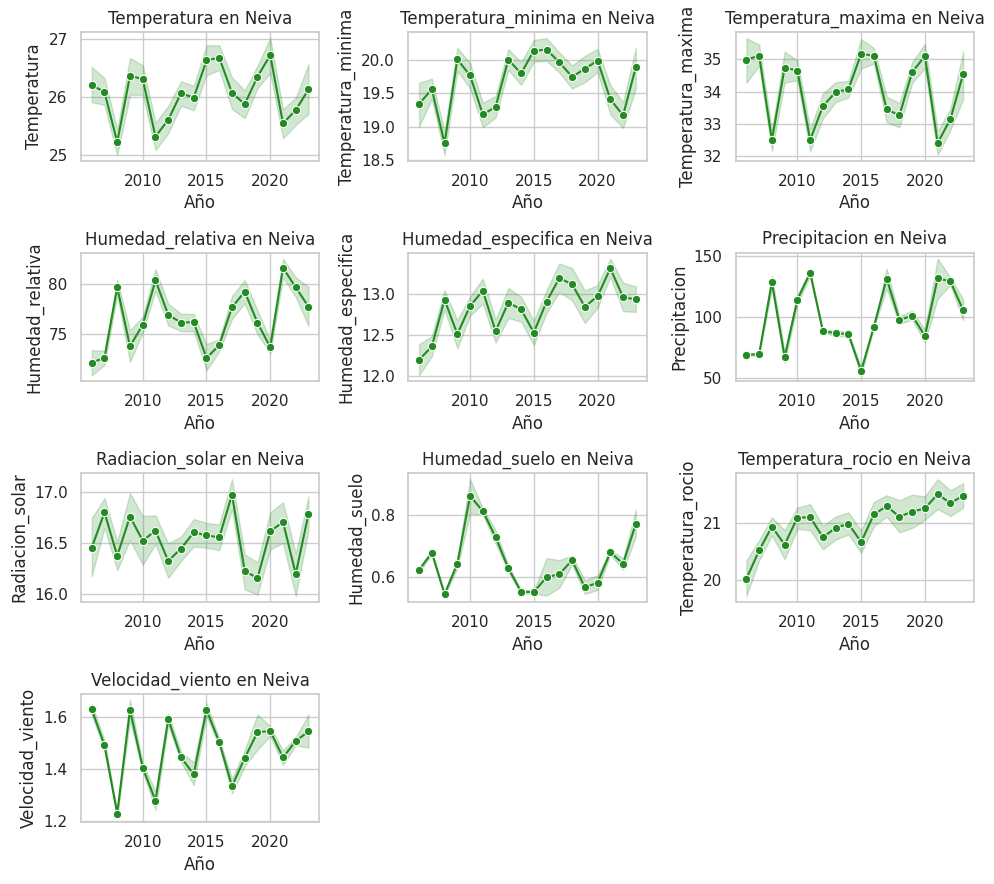

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


df_completo["Año"] = df_completo["Año_periodo"].str.extract(r"(\d+)").astype(int)


variables_clima = [
    'Temperatura', 'Temperatura_minima', 'Temperatura_maxima',
    'Humedad_relativa', 'Humedad_especifica',
    'Precipitacion', 'Radiacion_solar', 'Humedad_suelo',
    'Temperatura_rocio', 'Velocidad_viento'
]


municipio = "Neiva"


df_muni = df_completo[df_completo["Municipio"] == municipio]


sns.set(style="whitegrid")
plt.figure(figsize=(10, 9))


for i, var in enumerate(variables_clima, 1):
    plt.subplot(4, 3, i)
    sns.lineplot(data=df_muni, x="Año", y=var, marker="o", color="forestgreen")
    plt.title(f"{var} en {municipio}")
    plt.xlabel("Año")
    plt.ylabel(var)

plt.tight_layout()
plt.show()


/tmp/ipython-input-305-2406348983.py:6: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `y` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_completo, y="Municipio", order=df_completo["Municipio"].value_counts().index, palette="crest")


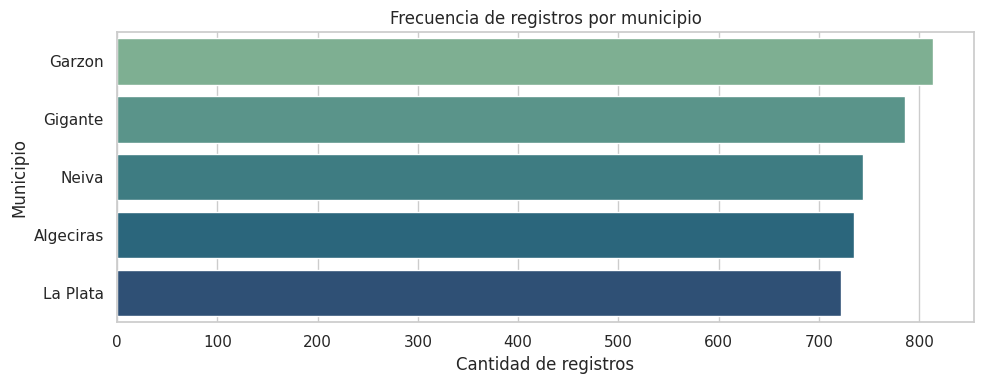

/tmp/ipython-input-305-2406348983.py:16: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.countplot(data=df_completo, x="Cultivo_final", order=df_completo["Cultivo_final"].value_counts().index, palette="flare")


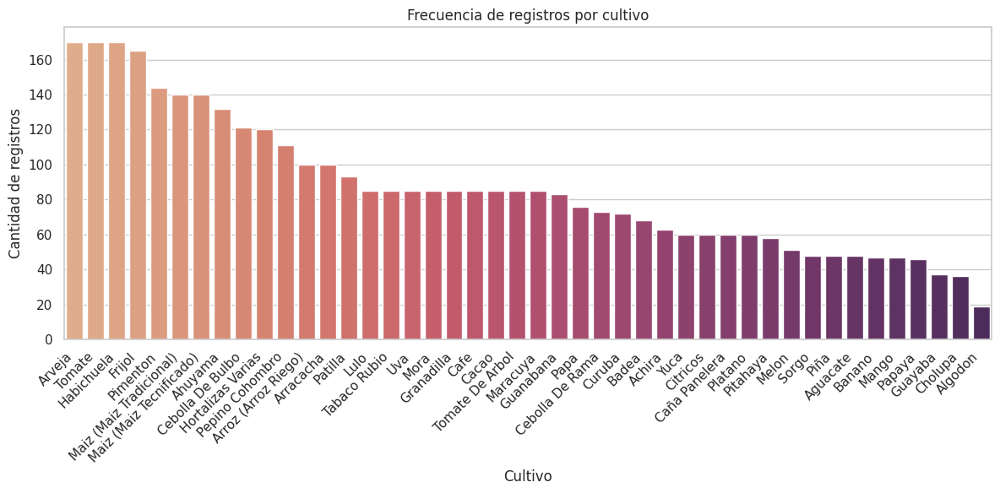

In [ ]:


plt.figure(figsize=(10, 4))
sns.countplot(data=df_completo, y="Municipio", order=df_completo["Municipio"].value_counts().index, palette="crest")
plt.title("Frecuencia de registros por municipio")
plt.xlabel("Cantidad de registros")
plt.ylabel("Municipio")
plt.grid(True, axis='x')
plt.tight_layout()
plt.show()

plt.figure(figsize=(12, 6))
sns.countplot(data=df_completo, x="Cultivo_final", order=df_completo["Cultivo_final"].value_counts().index, palette="flare")
plt.title("Frecuencia de registros por cultivo")
plt.xlabel("Cultivo")
plt.ylabel("Cantidad de registros")
plt.xticks(rotation=45, ha='right')
plt.grid(True, axis='y')
plt.tight_layout()
plt.show()


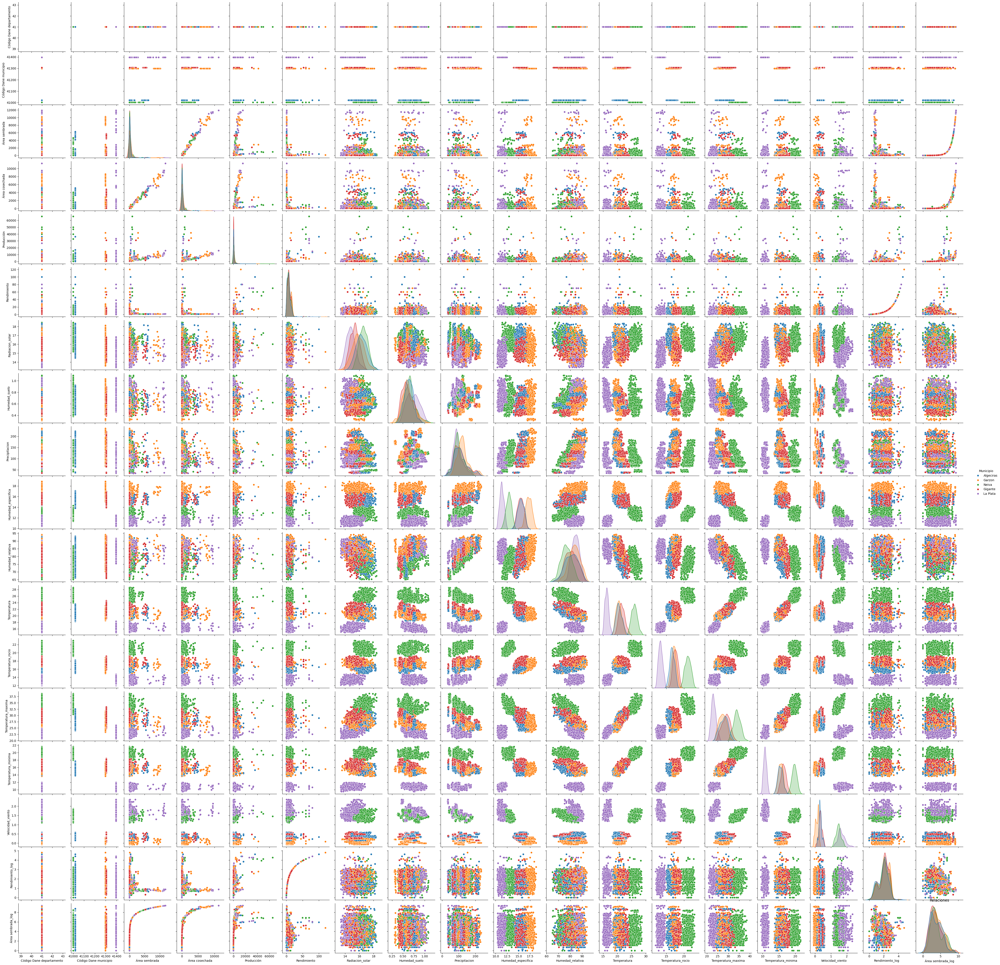

In [ ]:
sns.pairplot(df_completo, hue='Municipio')
plt.title('Relaciones')
plt.show()

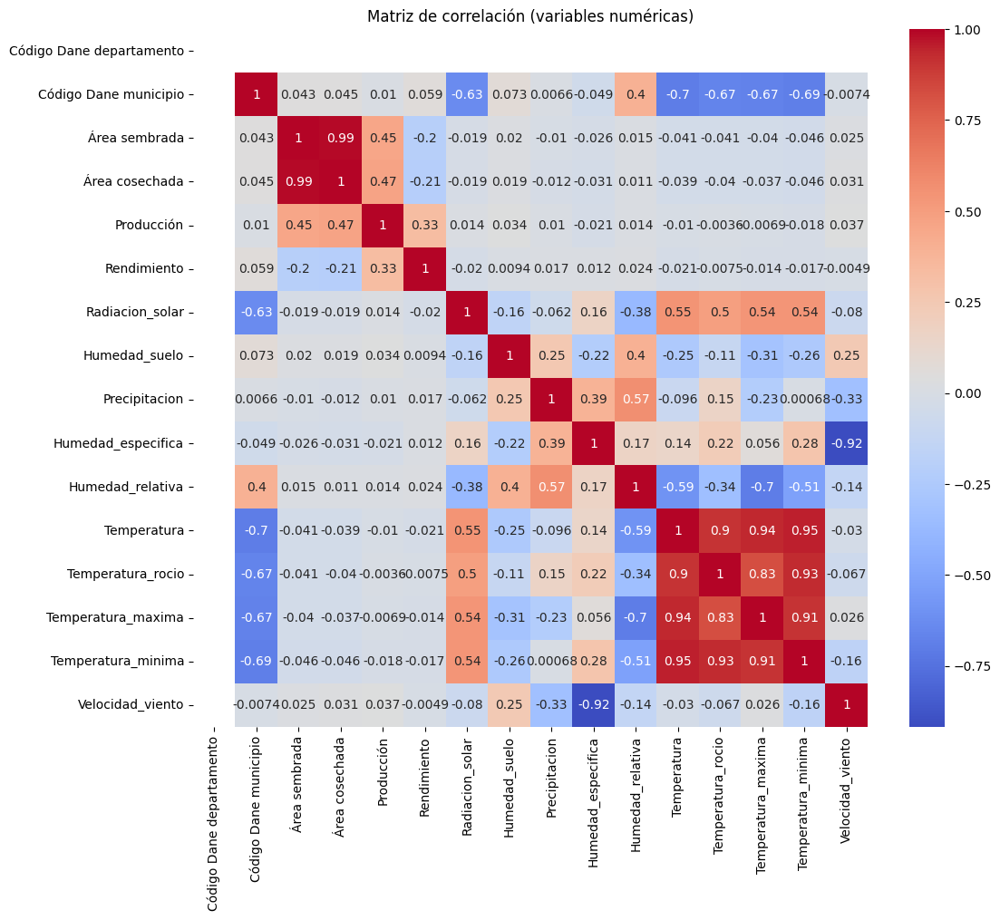

In [ ]:

plt.figure(figsize=(12, 10))
sns.heatmap(df_completo.select_dtypes(include=np.number).corr(), annot=True, cmap='coolwarm')
plt.title("Matriz de correlación (variables numéricas)")
plt.show()


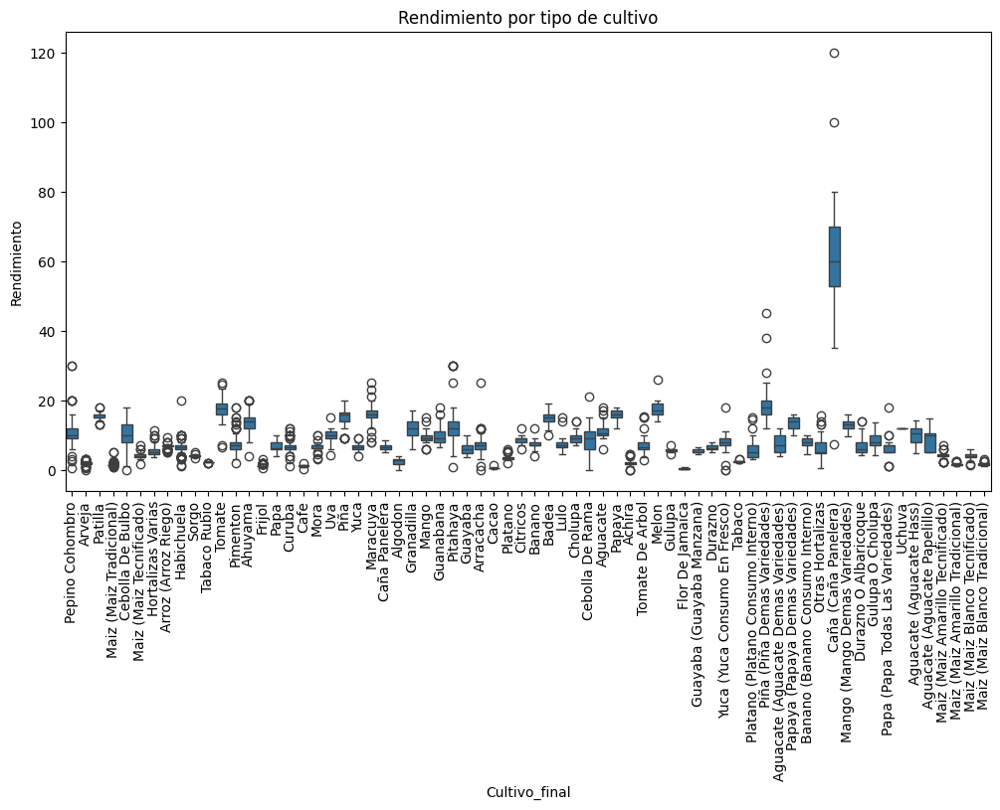

In [ ]:
plt.figure(figsize=(12,6))
sns.boxplot(x='Cultivo_final', y='Rendimiento', data=df_completo)
plt.xticks(rotation=90)
plt.title("Rendimiento por tipo de cultivo")
plt.show()


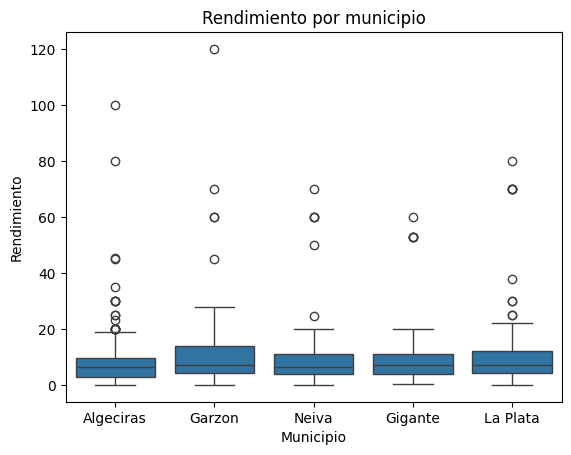

In [ ]:
sns.boxplot(data=df_completo, x='Municipio', y='Rendimiento')
plt.title("Rendimiento por municipio")
plt.show()


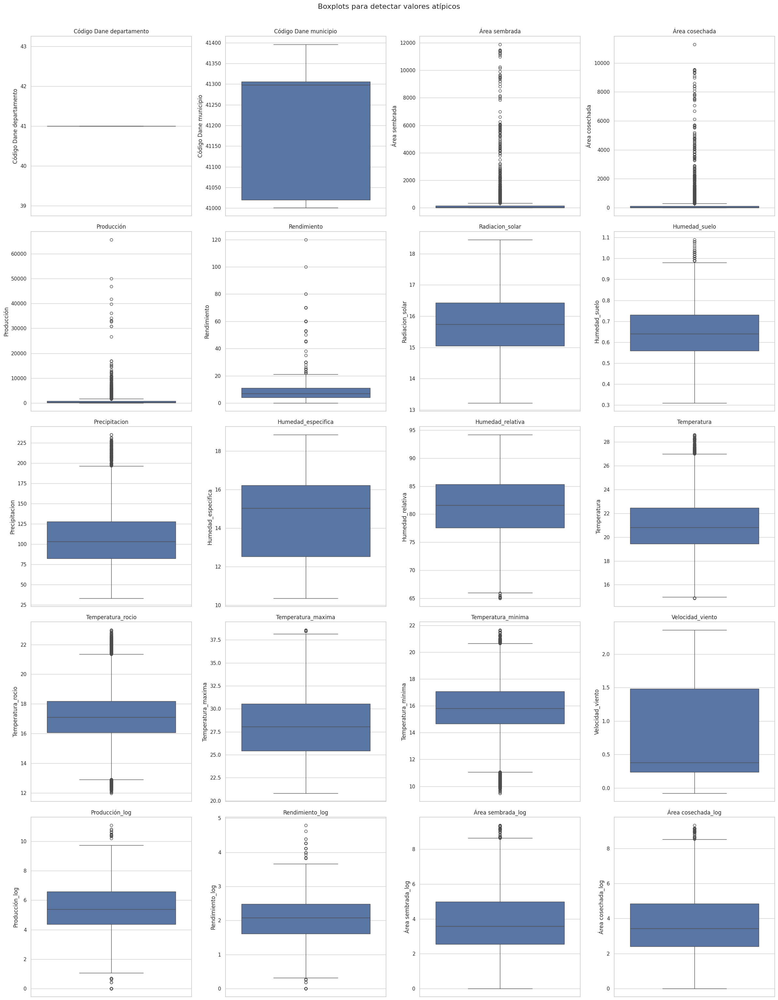

In [ ]:
import math

num_cols = len(numericas.columns)
cols = 4
rows = math.ceil(num_cols / cols)

plt.figure(figsize=(6 * cols, 6 * rows))
for i, col in enumerate(numericas.columns):
    plt.subplot(rows, cols, i+1)
    sns.boxplot(data=df_completo, y=col)
    plt.title(col)
plt.tight_layout()
plt.suptitle('Boxplots para detectar valores atípicos', y=1.02, fontsize=16)
plt.show()



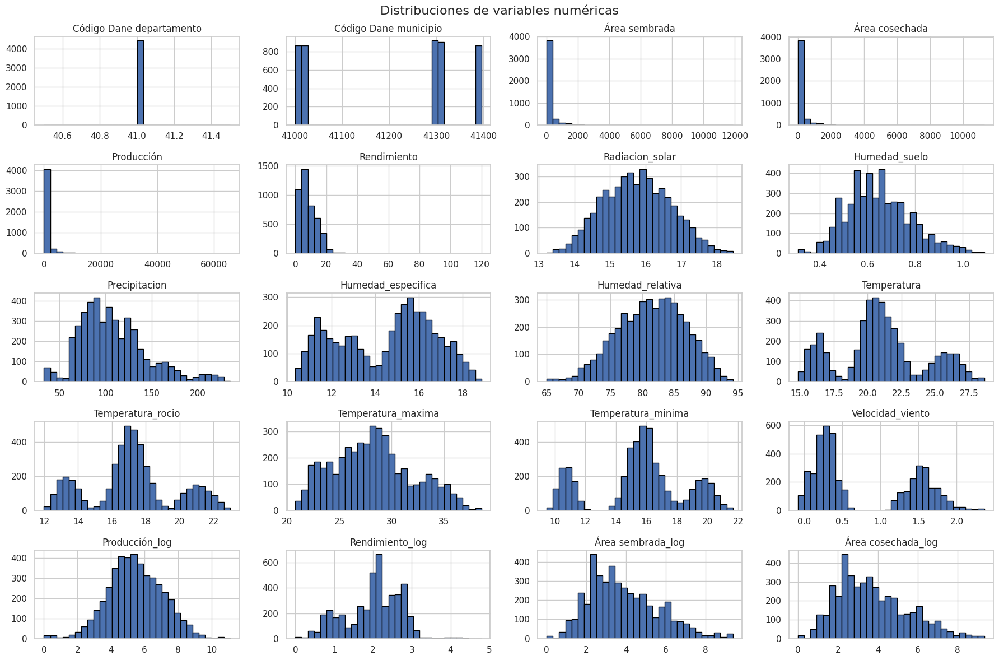

In [ ]:


numericas = df_completo.select_dtypes(include='number')

numericas.hist(figsize=(18, 12), bins=30, edgecolor='black')
plt.suptitle('Distribuciones de variables numéricas', fontsize=16)
plt.tight_layout()
plt.show()


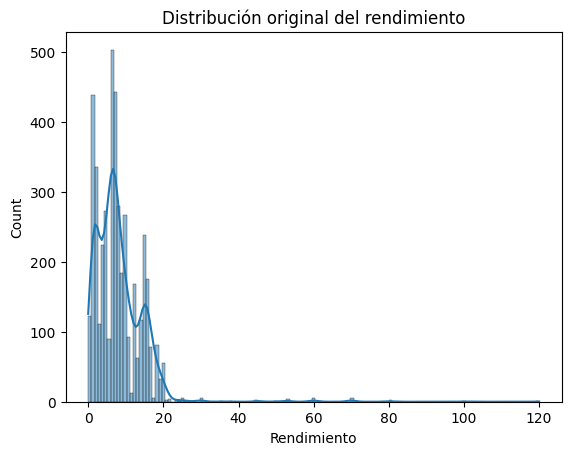

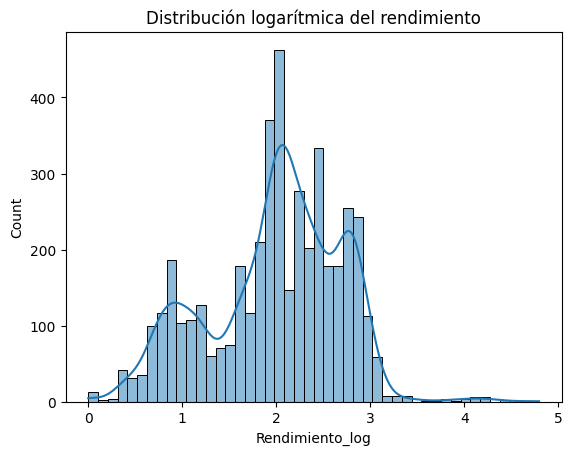

In [ ]:

sns.histplot(df_completo['Rendimiento'], kde=True)
plt.title("Distribución original del rendimiento")
plt.show()

sns.histplot(df_completo['Rendimiento_log'], kde=True)
plt.title("Distribución logarítmica del rendimiento")
plt.show()


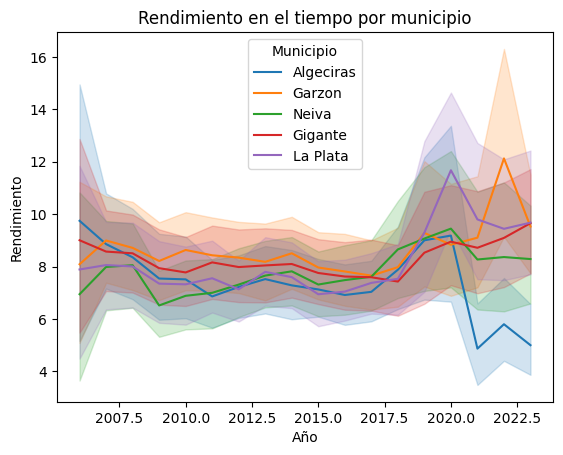

In [ ]:
df_completo['Año'] = df_completo['Año_periodo'].str.extract(r'(\d{4})').astype(int)

sns.lineplot(data=df_completo, x='Año', y='Rendimiento', hue='Municipio')
plt.title("Rendimiento en el tiempo por municipio")
plt.show()


#RANDOM FOREST REGRESSION

#Preparación de los datos

In [ ]:
from sklearn.model_selection import train_test_split, GridSearchCV

df_model = df_completo.copy()


X = df_model[['Código Dane municipio',	'Año_periodo',	'Área sembrada',
              'Cultivo_final',	'Radiacion_solar',	'Humedad_suelo',	'Precipitacion',	'Humedad_especifica',	'Humedad_relativa',
              'Temperatura',	'Temperatura_rocio',	'Temperatura_maxima',	'Temperatura_minima',	'Velocidad_viento']]

y = df_model['Rendimiento']

X = pd.get_dummies(X, columns=['Cultivo_final', 'Año_periodo'], drop_first=True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

X

,Código Dane municipio,Área sembrada,Radiacion_solar,Humedad_suelo,Precipitacion,Humedad_especifica,Humedad_relativa,Temperatura,Temperatura_rocio,Temperatura_maxima,...,Año_periodo_2019a,Año_periodo_2019b,Año_periodo_2020a,Año_periodo_2020b,Año_periodo_2021a,Año_periodo_2021b,Año_periodo_2022a,Año_periodo_2022b,Año_periodo_2023a,Año_periodo_2023b
0,41020,2.0,16.20,0.67,107.56,14.81,78.91,20.34,16.13,27.37,...,False,False,False,False,False,False,False,False,False,False
1,41298,40.0,16.67,0.60,129.03,17.60,81.53,20.81,16.41,27.15,...,False,False,False,False,False,False,False,False,False,False
2,41001,80.0,16.82,0.65,67.36,12.13,73.85,26.81,19.74,35.44,...,False,False,False,False,False,False,False,False,False,False
3,41306,100.0,15.28,0.62,108.67,14.41,81.04,20.81,17.70,30.14,...,False,False,False,False,False,False,False,False,False,False
4,41020,120.0,15.84,0.67,103.37,15.04,76.11,19.72,16.04,27.07,...,False,False,False,False,False,False,False,False,False,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3796,41306,13.5,15.61,0.61,126.76,15.60,82.94,21.81,18.55,27.02,...,False,False,False,False,False,False,False,False,True,False
3797,41306,25.5,14.94,0.67,129.64,15.75,81.42,21.20,18.15,29.14,...,False,False,False,False,False,False,False,False,True,False
3798,41306,8.0,15.54,0.44,73.99,16.03,73.09,23.49,18.18,29.97,...,False,False,False,False,False,False,False,False,False,True
3799,41306,24.0,15.66,0.65,128.44,15.43,80.37,22.04,17.03,27.32,...,False,False,False,False,False,False,False,False,True,False


#Entrenamiento del modelo inicial

In [ ]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error

model = RandomForestRegressor(random_state=42)

model.fit(X_train, y_train)

y_pred = model.predict(X_test)

print('R2:', r2_score(y_test, y_pred))
print('RMSE:', np.sqrt(mean_squared_error(y_test, y_pred)))
print('MAE:', mean_absolute_error(y_test, y_pred))

R2: 0.8726270365506463
RMSE: 1.8118424926177192
MAE: 1.087615505913272


#Optimización con GridSearchCV

In [ ]:
param_grid = {
    'n_estimators': [100, 200],
    'max_depth': [5, 10, None],
    'min_samples_split': [2, 5],
    'min_samples_leaf': [1, 2]
}

grid_search = GridSearchCV(RandomForestRegressor(random_state=42), param_grid,
                           cv=5, scoring='r2', n_jobs=-1, verbose=1)

grid_search.fit(X_train, y_train)

print('Mejores parametros:', grid_search.best_params_)

Fitting 5 folds for each of 24 candidates, totalling 120 fits
Mejores parametros: {'max_depth': None, 'min_samples_leaf': 2, 'min_samples_split': 5, 'n_estimators': 200}


#Reentrenamiento con los mejores parámetros

In [ ]:
best_model = grid_search.best_estimator_

best_model.fit(X_train, y_train)

y_pred_optimized = best_model.predict(X_test)


print("R² optimizado:", r2_score(y_test, y_pred_optimized))
print('RMSE optimizado:', np.sqrt(mean_squared_error(y_test, y_pred_optimized)))
print('MAE optimizado:', mean_absolute_error(y_test, y_pred_optimized))

NameError: name 'grid_search' is not defined

# gráfico de Predicciones vs Valores reales

NameError: name 'y_pred_optimized' is not defined

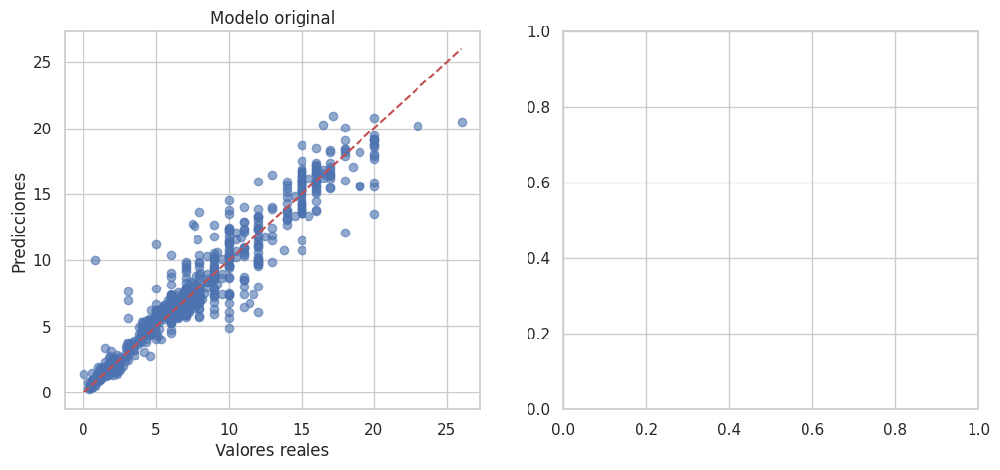

In [ ]:
# Gráfico para el modelo sin optimizar
plt.figure(figsize=(12,5))

plt.subplot(1,2,1)
plt.scatter(y_test, y_pred, alpha=0.6)
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title('Modelo original')
plt.xlabel('Valores reales')
plt.ylabel('Predicciones')

# Gráfico para el modelo optimizado
plt.subplot(1,2,2)
plt.scatter(y_test, y_pred_optimized, alpha=0.6, color='green')
plt.plot([y_test.min(), y_test.max()], [y_test.min(), y_test.max()], 'r--')
plt.title('Modelo optimizado')
plt.xlabel('Valores reales')
plt.ylabel('Predicciones')

plt.tight_layout()
plt.show()



#Validación cruzada y estabilidad

In [ ]:
from sklearn.model_selection import cross_val_score

scores = cross_val_score(best_model, X, y, cv=5, scoring='r2')
print("Validación cruzada R²:", scores)
print("Media:", scores.mean())


Validación cruzada R²: [0.84419798 0.90923127 0.91562257 0.87074171 0.56203307]
Media: 0.8203653217655601


#Grafico de residuos

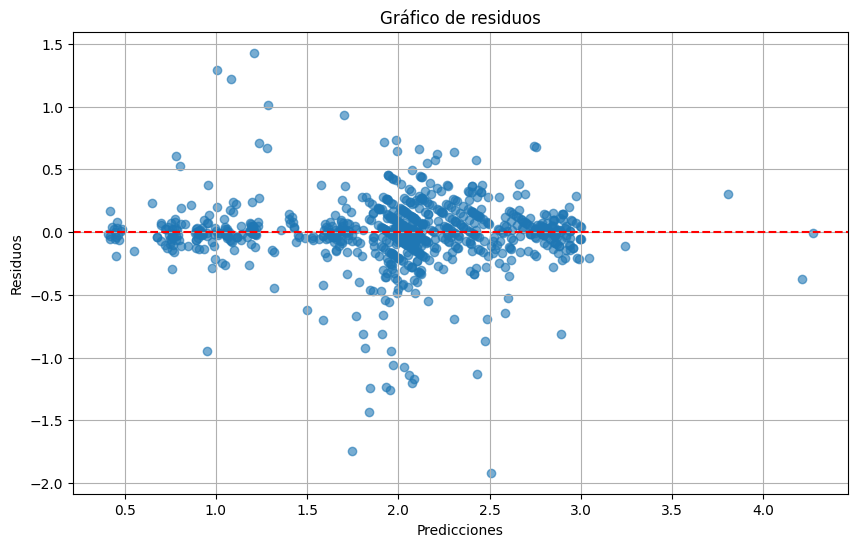

In [ ]:
residuos = y_test - y_pred_optimized

plt.figure(figsize=(10, 6))
plt.scatter(y_pred_optimized, residuos, alpha=0.6)
plt.axhline(y=0, color='r', linestyle='--')
plt.xlabel('Predicciones')
plt.ylabel('Residuos')
plt.title('Gráfico de residuos')
plt.grid(True)
plt.show()


In [ ]:
y_pred_log = model.predict(X)
y_pred = np.expm1(y_pred_log)
y_real = np.expm1(y)

errores = y_real - y_pred
df_errores = pd.DataFrame({
    'Real': y_real,
    'Predicho': y_pred,
    'Error': errores
})

df_errores.sort_values(by='Error', ascending=False).head(10)


,Real,Predicho,Error
4045,120.0,58.369198,61.630802
3528,100.0,77.673126,22.326874
3387,25.0,7.425496,17.574504
544,30.0,14.615664,15.384336
150,30.0,14.655243,15.344757
4017,70.0,55.298843,14.701157
4371,45.0,30.699123,14.300877
3727,30.0,15.774066,14.225934
3338,30.0,16.211422,13.788578
3073,60.0,46.284050,13.715950


#REDES NEURONALES

In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import OneHotEncoder, LabelEncoder, StandardScaler
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Input, Dense
from tensorflow.keras.callbacks import EarlyStopping
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
import os
import random

SEED = 8
os.environ['PYTHONHASHSEED'] = str(SEED)
random.seed(SEED)
np.random.seed(SEED)
tf.random.set_seed(SEED)


#Transformaciones iniciales

In [ ]:

df_completo['Año_periodo_encoded'] = LabelEncoder().fit_transform(df_completo['Año_periodo'])

num_features = ['Código Dane municipio', 'Año_periodo_encoded', 'Área sembrada']
cat_features = ['Cultivo_final']


ohe = OneHotEncoder(handle_unknown='ignore', sparse_output=False)
scaler = StandardScaler()

preprocessor = ColumnTransformer([
    ('num', scaler, num_features),
    ('cat', ohe, cat_features)
])

X_raw = df_completo[num_features + cat_features]
X = preprocessor.fit_transform(X_raw)

#Preparacion de los datos

In [ ]:

y_clima = df_completo[['Temperatura', 'Temperatura_minima', 'Temperatura_maxima', 'Temperatura_rocio',
              'Humedad_relativa', 'Humedad_especifica', 'Humedad_suelo',
              'Precipitacion', 'Radiacion_solar', 'Velocidad_viento']]

y_rend = df_completo[['Rendimiento']]


X_train, X_test, y_clima_train, y_clima_test, y_rend_train, y_rend_test = train_test_split(
    X, y_clima, y_rend, test_size=0.2, random_state=42
)

#Creacion de la red neuronal multitarea

In [ ]:

inputs = Input(shape=(X_train.shape[1],))
x = Dense(256, activation='relu')(inputs)
x = Dense(128, activation='relu')(x)
clima_out = Dense(10, name="clima_out")(x)


z = Dense(64, activation='relu')(clima_out)
z = Dense(32, activation='relu')(z)
rend_out = Dense(1, name="rend_out")(z)

modelo = Model(inputs=inputs, outputs=[clima_out, rend_out])
modelo.compile(
    optimizer='adam',
    loss={'clima_out': 'mse', 'rend_out': 'mse'},
    loss_weights={'clima_out': 0.2, 'rend_out': 0.8}
)

#Entrenamiento del modelo

In [ ]:

es = EarlyStopping(patience=10, restore_best_weights=True)
hist = modelo.fit(
    X_train, [y_clima_train, y_rend_train],
    validation_data=(X_test, [y_clima_test, y_rend_test]),
    epochs=300, batch_size=64, callbacks=[es]
)

Epoch 1/300
48/48 ━━━━━━━━━━━━━━━━━━━━ 3s 13ms/step - clima_out_loss: 2072.6189 - loss: 473.7601 - rend_out_loss: 73.9899 - val_clima_out_loss: 1841.6361 - val_loss: 383.5229 - val_rend_out_loss: 19.5176
Epoch 2/300
48/48 ━━━━━━━━━━━━━━━━━━━━ 1s 6ms/step - clima_out_loss: 1449.5988 - loss: 305.9896 - rend_out_loss: 20.0008 - val_clima_out_loss: 368.5088 - val_loss: 85.0022 - val_rend_out_loss: 14.4503
Epoch 3/300
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - clima_out_loss: 218.8089 - loss: 56.7211 - rend_out_loss: 16.1930 - val_clima_out_loss: 172.8823 - val_loss: 39.5823 - val_rend_out_loss: 6.4270
Epoch 4/300
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step - clima_out_loss: 152.2982 - loss: 36.3562 - rend_out_loss: 7.3705 - val_clima_out_loss: 164.8570 - val_loss: 36.5644 - val_rend_out_loss: 4.6479
Epoch 5/300
48/48 ━━━━━━━━━━━━━━━━━━━━ 0s 6ms/step - clima_out_loss: 146.4385 - loss: 33.5109 - rend_out_loss: 5.2798 - val_clima_out_loss: 161.1693 - val_loss: 35.1987 - val_rend_out_loss: 3.8592
Epo

#Evaluacion y metricas del modelo

In [ ]:

losses = modelo.evaluate(X_test, [y_clima_test, y_rend_test])
print(f"Loss total: {losses[0]:.4f}")
print(f"Loss clima: {losses[1]:.4f}")
print(f"Loss rendimiento: {losses[2]:.4f}")


y_pred = modelo.predict(X_test)[1]
r2 = r2_score(y_rend_test, y_pred)
rmse = np.sqrt(mean_squared_error(y_rend_test, y_pred))
mae = mean_absolute_error(y_rend_test, y_pred)

print(f"R2: {r2:.4f}")
print(f"RMSE: {rmse:.4f}")
print(f"MAE: {mae:.4f}")


24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 3ms/step - clima_out_loss: 126.9521 - loss: 27.0854 - rend_out_loss: 2.1446
Loss total: 29.2717
Loss clima: 139.8536
Loss rendimiento: 1.9498
24/24 ━━━━━━━━━━━━━━━━━━━━ 0s 5ms/step
R2: 0.9239
RMSE: 1.4001
MAE: 0.9027


#Grafica del rendimiento (Predicho vs Real)

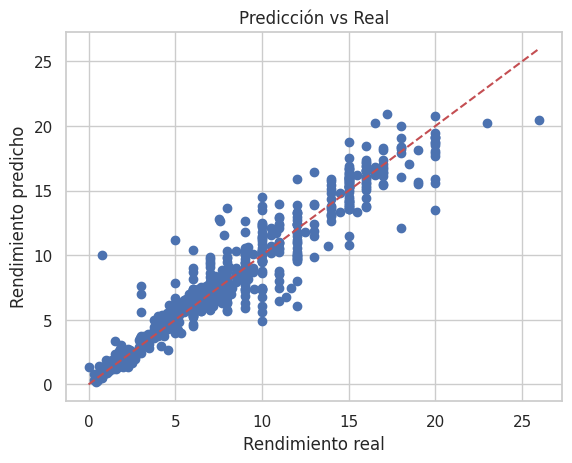

In [ ]:

plt.scatter(y_rend_test, y_pred)
y_real_max = y_rend_test.values.max()
y_pred_max = y_pred.max()
limite = max(y_real_max, y_pred_max)
plt.plot([0, limite], [0, limite], 'r--')
plt.xlabel("Rendimiento real")
plt.ylabel("Rendimiento predicho")
plt.title("Predicción vs Real")
plt.grid(True)
plt.show()